<a href="https://colab.research.google.com/github/ksjgh/AI_for_ME/blob/main/13_Fluid%2BAI_CNN_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<br><br>
<font size='6'><b>AI for Mechanical Engineering: Fluid Mechanics</b></font><br><br>

<br>
<div class=pull-right>
By Jaejung Park<br>
http://iailab.kaist.ac.kr/<br>
Industrial AI Lab at KAIST
</div>


# 1. Optimization
## 1.1. Convex Optimization with CVXPY

We want to design a Venturi meter using cvxpy to maximize the pressure at Point 1. Given the constraints on a, b, and c, find the maximum pressure at Point 1 and the corresponding values of a, b, and c. (Define the specific weight of JP-4 fuel as 9.807)

\begin{array}{I}
& 10 \leq a-c \leq  30 \\
& 15 \leq a+b \leq  25 \\
& 25 \leq 3b+c \leq  45 \\
& a, b \geq  1 \\
& c \geq  6 \\
\end{array}

<center>
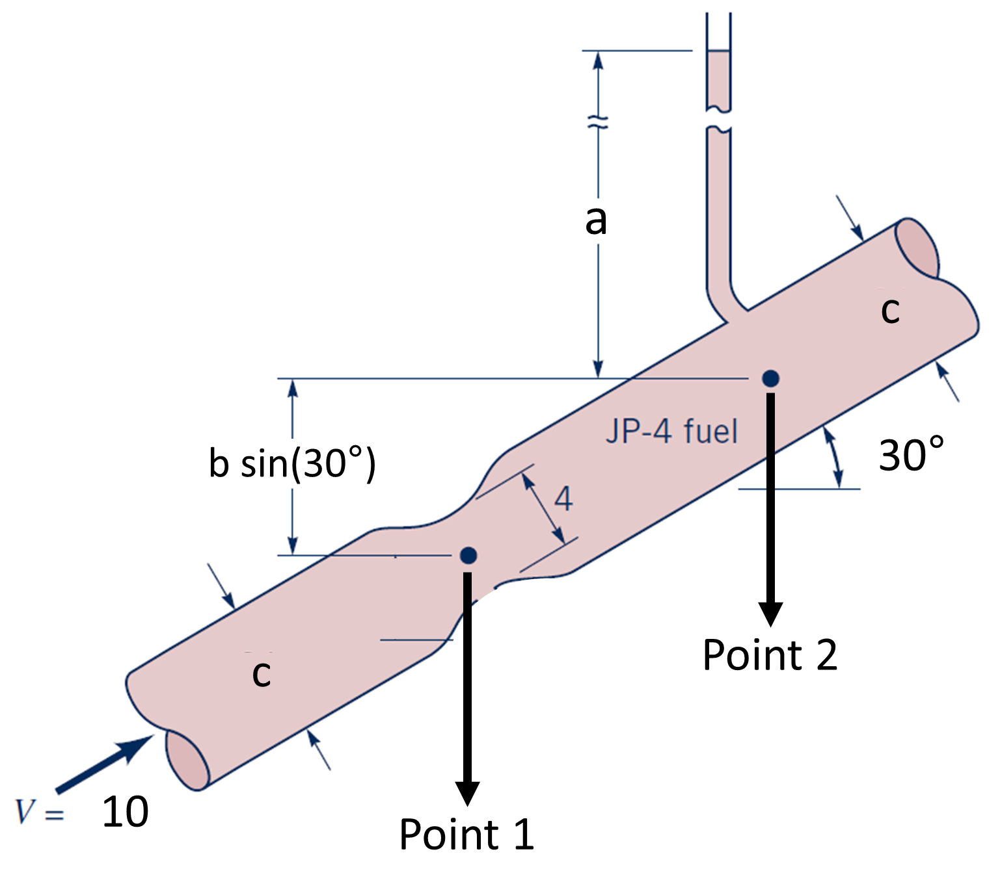

<br>

$$
\begin{array}{I}
\max \quad &\gamma a + \gamma (b sin(30°)) + \frac{\gamma V^2 (1-\frac{c^2}{16})}{2g}  \\
\text{subject to} \quad
& 10 \leq a-c \leq  30 \\
& 15 \leq a+b \leq  25 \\
& 25 \leq 3b+c \leq  45 \\
& a, b \geq  1 \\
& c \geq  6 \\
\end{array}
\quad\implies\quad
\begin{array}{I}
\min \quad &-\gamma(a + (b sin(30°)) + \frac{ V^2 (1-\frac{c^2}{16})}{2g}) \\
\text{subject to} \quad
& 10 \leq a-c \leq  30 \\
& 15 \leq a+b \leq  25 \\
& 25 \leq 3b+c \leq  45 \\
& a, b \geq  1 \\
& c \geq  6 \\
\end{array}
$$

<br>

<br>

$$
\begin{array}{I}
\min \quad &-\gamma(a + (b sin(30°)) + \frac{ V^2 (1-\frac{c^2}{16})}{2g}) \\
\text{subject to} \quad
& 10 \leq a-c \leq  30 \\
& 15 \leq a+b \leq  25 \\
& 25 \leq 3b+c \leq  45 \\
& a, b \geq  1 \\
& c \geq  6 \\
\end{array}
\quad\implies\quad
\begin{array}{I}
\min_{X} \quad & -\gamma(X^T HX + f^T X) \\
\text{subject to} \quad
& AX \leq b \\
& AX \geq b_{lower} \\
& X \geq lb
\end{array}
$$

<br>

In [ ]:
import cvxpy as cvx
import numpy as np

x = cvx.Variable(3)

f = np.array([[1], [np.sin(np.deg2rad(30))], [0]])

H = np.array([
    [0, 0, 0],
    [0, 0, 0],
    [0, 0, -10**2 / (16 * 2 * 9.8)]
])

objective = cvx.Minimize(-(cvx.quad_form(x, H) + f.T @ x + 10**2/(2*9.8)))

A = np.array([
    [1, 0, -1],
    [1, 1, 0],
    [0, 3, 1]
])

b = np.array([30, 25, 45])
b_lower = np.array([10, 15, 25])
lb = np.array([1, 1, 6])

constraints = [A @ x <= b, A @ x >= b_lower, lb <= x ]

prob = cvx.Problem(objective, constraints)
result = prob.solve()

print("The optimal value is", result * - 9.807)
print("A solution [a, b, c] is")
print(x.value)

The optimal value is 151.57485714285716
A solution [a, b, c] is
[18.66666667  6.33333333  6.        ]


# 2. Dimensionality Reduction

## 2.1. SVD

Data Desciription

- ALL.mat  -  151 snapshots of u and v velocity as well as vorticity (UALL, VALL, VORTALL).

- Datat set for fluid flow past at cylinder at RE = 100

- Download data [here](https://www.dropbox.com/scl/fi/nh2wvz9j3l154ens935qh/CYLINDER_ALL.mat?rlkey=5w5tui2fv6mdv324kapdf516j&st=f477ed8q&dl=0)

Given the data above, perform SVD to obtain U, S, and V. Then, perform truncated SVD to obtain a 5-rank approximation and compare the results with the original data. The data to be used for this SVD is 'flows_mat', and the code for this is provided below.
- Input shape: (89351 x 151)
    - 449 x 199 dimensions for 151 time steps

__Data Preprocessing and Visualization__

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from scipy import io
import numpy as np

flows = io.loadmat('/content/drive/MyDrive/Data/CYLINDER_ALL.mat')

In [ ]:
flows_mat_u = flows['UALL']
flows_mat_v = flows['VALL']
flows_mat_vort = flows['VORTALL']

flows_mat_u.shape

(89351, 151)

In [ ]:
nx = 449
ny = 199

flows_mat_u[:,0].reshape(nx, ny),

(array([[1.01243 , 1.01186 , 1.01119 , ..., 1.01816 , 1.01862 , 1.019   ],
        [1.01394 , 1.01323 , 1.01255 , ..., 1.01956 , 1.02001 , 1.02046 ],
        [1.01516 , 1.01458 , 1.01393 , ..., 1.02097 , 1.02139 , 1.02175 ],
        ...,
        [1.01202 , 1.01168 , 1.01129 , ..., 0.888106, 0.891065, 0.894012],
        [1.00918 , 1.00873 , 1.00829 , ..., 0.890758, 0.893679, 0.896936],
        [1.00618 , 1.00579 , 1.00532 , ..., 0.893477, 0.896224, 0.898832]]),)

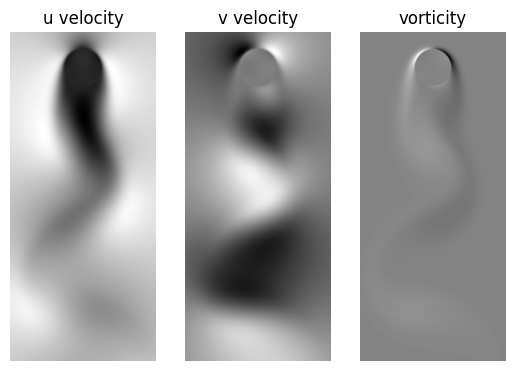

In [ ]:
import matplotlib.pyplot as plt
plt.subplot(1,3,1)
plt.imshow(flows_mat_u[:,150].reshape(nx, ny), 'gray')
plt.title('u velocity')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(flows_mat_v[:,150].reshape(nx, ny), 'gray')
plt.title('v velocity')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(flows_mat_vort[:,150].reshape(nx, ny), 'gray')
plt.title('vorticity')
plt.axis('off')

plt.show()

In [ ]:
from matplotlib.animation import FuncAnimation
import time
from IPython import display

fig = plt.figure()
ax1 = fig.add_subplot(1, 3, 1)
ax2 = fig.add_subplot(1, 3, 2)
ax3 = fig.add_subplot(1, 3, 3)

def animate(i):
  ax1.clear()
  ax1.imshow(flows_mat_u[:,i].reshape(nx, ny), 'gray')
  ax1.set_title('u velocity')
  ax1.axis('off')
  ax2.clear()
  ax2.imshow(flows_mat_v[:,i].reshape(nx, ny), 'gray')
  ax2.set_title('v velocity')
  ax2.axis('off')
  ax3.clear()
  ax3.imshow(flows_mat_vort[:,i].reshape(nx, ny), 'gray')
  ax3.set_title('vorticity')
  ax3.axis('off')

ani = FuncAnimation(fig, animate, frames = int(150/1), interval = 10)
video = ani.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()

In [ ]:
flows_mat_vort_mean = flows_mat_vort.mean(axis = 1)
flows_mat_vort_centered = flows_mat_vort - flows_mat_vort_mean[:, None]
flows_mat_vort_centered_normalized = (flows_mat_vort_centered - flows_mat_vort_centered.min()) / (flows_mat_vort_centered.max() - flows_mat_vort_centered.min())

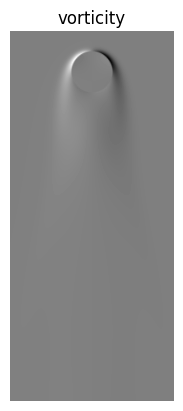

In [ ]:
plt.imshow(flows_mat_vort_mean.reshape(nx, ny), 'gray')
plt.title('vorticity')
plt.axis('off')
plt.show()

In [ ]:
flows_mat = flows_mat_vort_centered_normalized

__Perform SVD__


In [ ]:
U, S, VT = np.linalg.svd(flows_mat, full_matrices = False)
print(U.shape)
print(S.shape)
print(VT.shape)

(89351, 151)
(151,)
(151, 151)


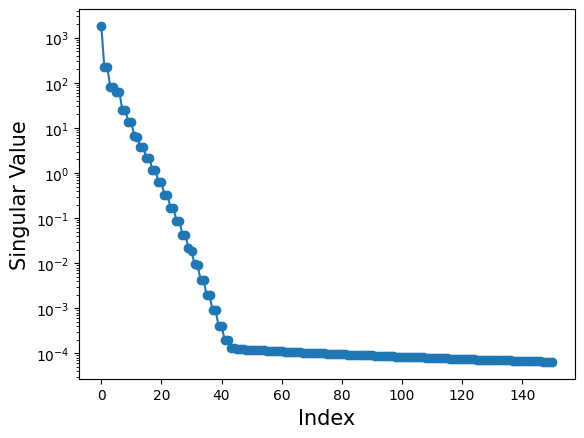

In [ ]:
plt.semilogy(S, '-o')
plt.ylabel('Singular Value', fontsize = 15)
plt.xlabel('Index', fontsize = 15)
plt.show()

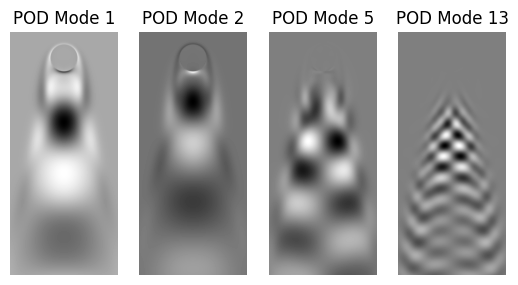

In [ ]:
plt.subplot(1,4,1)
plt.imshow(U[:,0].reshape(nx, ny), 'gray')
plt.title('POD Mode 1')
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(U[:,1].reshape(nx, ny), 'gray')
plt.title('POD Mode 2')
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(U[:,4].reshape(nx, ny), 'gray')
plt.title('POD Mode 5')
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(U[:,12].reshape(nx, ny), 'gray')
plt.title('POD Mode 13')
plt.axis('off')

plt.show()

In [ ]:
U = np.asmatrix(U)
diagS = np.asmatrix(np.diag(S))
VT = np.asmatrix(VT)

print(U.shape, diagS.shape, VT.shape, '\n')

(89351, 151) (151, 151) (151, 151) 



__Perform Truncated SVD with Five Rank Approximation__

In [ ]:
k = 5

low_U = U[:, :k]
low_S = diagS[:k, :k]
low_VT = VT[:k, :]
low_flows_mat = low_U*low_S*low_VT

print(low_U.shape, low_S.shape, low_VT.shape, '\n')

(89351, 5) (5, 5) (5, 151) 



In [ ]:
from matplotlib.animation import FuncAnimation
import time
from IPython import display

fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

def animate(i):
  ax1.clear()
  ax1.imshow(flows_mat[:,i].reshape(nx, ny), 'gray')
  ax1.axis('off')
  ax2.clear()
  ax2.imshow(low_flows_mat[:,i].reshape(nx, ny), 'gray')
  ax2.axis('off')

ani = FuncAnimation(fig, animate, frames = int(150/1), interval = 10)
video = ani.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()

## 2.2. Autoencoder
- Latent space dimensions: 30, 10, 5, 2
- Train each autoencoder separately with the same training dataset
- The data to be used will be constructed based on the u velocity values from the SVD example.

<center>
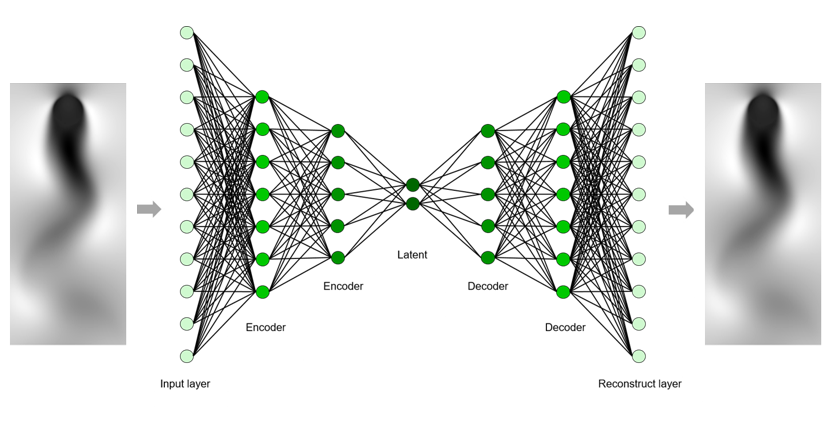

__Data Preprocessing and Visualization__


In [ ]:
import numpy as np
from numpy import linalg
import matplotlib.pyplot as plt
%matplotlib inline

flows_mat_u_mean = flows_mat_u.mean(axis = 1)
flows_mat_u_centered = flows_mat_u - flows_mat_u_mean[:, None]

print(flows_mat_u_centered.shape)

(89351, 151)


(-0.5, 198.5, 448.5, -0.5)

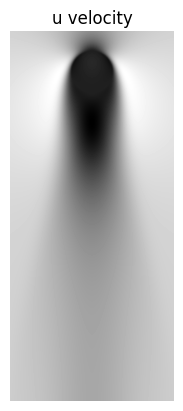

In [ ]:
nx = 449
ny = 199

plt.imshow(flows_mat_u_mean.reshape(nx, ny), 'gray')
plt.title('u velocity')
plt.axis('off')

In [ ]:
flows_mat_u_centered_normalized = (flows_mat_u_centered - flows_mat_u_centered.min()) / (flows_mat_u_centered.max() - flows_mat_u_centered.min())
train_x = flows_mat_u_centered_normalized.T.reshape(-1, nx, ny, 1)

__Define Function to Create and Train Autoencoder Models with Different Latent Dimensions__

In [ ]:
import tensorflow as tf

def create_and_train_model(lat_dim):
    input_shape = (449, 199, 1)
    encoder = tf.keras.models.Sequential([
        tf.keras.layers.Flatten(input_shape = input_shape),
        tf.keras.layers.Dense(256, activation = 'relu'),
        tf.keras.layers.Dense(64, activation = 'relu'),
        tf.keras.layers.Dense(lat_dim, activation = None)
    ])

    decoder = tf.keras.models.Sequential([
        tf.keras.layers.Dense(64, activation = 'relu', input_shape = (lat_dim,)),
        tf.keras.layers.Dense(256, activation = 'relu'),
        tf.keras.layers.Dense(449*199, activation = None),
        tf.keras.layers.Reshape(input_shape)
    ])

    inputs = tf.keras.Input(shape = input_shape)
    latent = encoder.output
    result = decoder(latent)

    model = tf.keras.Model(inputs = encoder.input, outputs = result)
    model.compile(optimizer = 'adam', loss = 'mean_squared_error')
    model.fit(train_x, train_x, epochs = 500, verbose = 0)

    return model, encoder

__Train Autoencoders with Different Latent Dimensions__

In [ ]:
model30, encoder30 = create_and_train_model(30)
model10, encoder10 = create_and_train_model(10)
model5, encoder5 = create_and_train_model(5)
model2, encoder2 = create_and_train_model(2)

__Encode Datasets to the Latent Space and Reconstruct to the Original Image with Decoders__

In [ ]:
predict30 = model30.predict(train_x)
predict30 = predict30.reshape(151, 89351)
train_30 = train_x.reshape(151, 89351)

predict10 = model10.predict(train_x)
predict10 = predict10.reshape(151, 89351)
train_10 = train_x.reshape(151, 89351)

predict5 = model5.predict(train_x)
predict5 = predict5.reshape(151, 89351)
train_5 = train_x.reshape(151, 89351)

predict2 = model2.predict(train_x)
predict2 = predict2.reshape(151, 89351)
train_2 = train_x.reshape(151, 89351)

5/5 [==============================] - 0s 5ms/step


__Visualize Reconstruction Results from the Latent Space__
- We just need 30, 10, 5, 2 dimensional data and the decoder for reconstructing the original image with the dimension of 89,351

__Latent Space with 30 Dimensions__

In [ ]:
# Let's see the flow in time
from matplotlib.animation import FuncAnimation
import time
from IPython import display

fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

def animate(i):
  ax1.clear()
  ax1.imshow(train_30[i,:].reshape(nx, ny), 'gray')
  ax1.set_title('Ground Truth')
  ax1.axis('off')
  ax2.clear()
  ax2.imshow(predict30[i,:].reshape(nx, ny), 'gray')
  ax2.set_title('Reconstructed')
  ax2.axis('off')

ani = FuncAnimation(fig, animate, frames = int(150/1), interval = 10)
video = ani.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()

__Latent Space with 10 Dimensions__

In [ ]:
# Let's see the flow in time

from matplotlib.animation import FuncAnimation
import time
from IPython import display

fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

def animate(i):
  ax1.clear()
  ax1.imshow(train_10[i,:].reshape(nx, ny), 'gray')
  ax1.set_title('Ground Truth')
  ax1.axis('off')
  ax2.clear()
  ax2.imshow(predict10[i,:].reshape(nx, ny), 'gray')
  ax2.set_title('Reconstructed')
  ax2.axis('off')

ani = FuncAnimation(fig, animate, frames = int(150/1), interval = 10)
video = ani.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()

__Latent Space with 5 Dimensions__

In [ ]:
# Let's see the flow in time

from matplotlib.animation import FuncAnimation
import time
from IPython import display

fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

def animate(i):
  ax1.clear()
  ax1.imshow(train_5[i,:].reshape(nx, ny), 'gray')
  ax1.set_title('Ground Truth')
  ax1.axis('off')
  ax2.clear()
  ax2.imshow(predict5[i,:].reshape(nx, ny), 'gray')
  ax2.set_title('Reconstructed')
  ax2.axis('off')

ani = FuncAnimation(fig, animate, frames = int(150/1), interval = 10)
video = ani.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()

__Latent Space with 2 Dimensions__

- With the help of the latent space, we can easily notice that the cylinder flow has period of 30 time steps.
- Rotation around the circle in the latent space takes 30 time steps.

In [ ]:
# Let's see the flow in time

from matplotlib.animation import FuncAnimation
import time
from IPython import display

fig = plt.figure(figsize = (8, 10))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 1, 2)

lat = encoder2.predict(train_x)
lat = lat.reshape(151, 2)

def animate(i):
  ax1.clear()
  ax1.imshow(train_2[i,:].reshape(nx, ny), 'gray')
  ax1.set_title('Ground Truth')
  ax1.axis('off')
  ax2.clear()
  ax2.imshow(predict2[i,:].reshape(nx, ny), 'gray')
  ax2.set_title('Reconstructed Time Step: {}'.format(i))
  ax2.axis('off')
  ax3.clear()
  ax3.scatter(lat[:,0], lat[:,1], alpha = 0.3)
  ax3.scatter(lat[i,0], lat[i,1], color = 'r', s = 50)
  ax3.set_title('Latent Space Visualization (Time Step {})'.format(i))
  ax3.set_xticks([])
  ax3.set_yticks([])
  #ax3.axis('off')

ani = FuncAnimation(fig, animate, frames = int(150/1), interval = 100)
video = ani.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()

5/5 [==============================] - 0s 4ms/step


# 3. Prediction

## 3.1 Polynomial Regression
Let's assume the following scenario. We have data from measuring P2 while varying Q1. However, we don't have sensors or devices to measure A1 and P1. In this case, let's use the relationship between P2 and Q1 to infer A1 and P1 based on the data. Additionally, assume that the flow rate divides evenly between pipes (2) and (3). (Density of the fluid is 1000)
- Objective: determine constant pressure (P1) and area of the first pipe (A1)
- Given: measured P2 while varying Q1
- Download data [here](https://www.dropbox.com/scl/fi/3d1oae7djg2uk3mjga5og/pressure_flowrate.csv?rlkey=lrojgbvs6bb4gg8vwp6vr835x&st=j61fg3w2&dl=0)

<center>
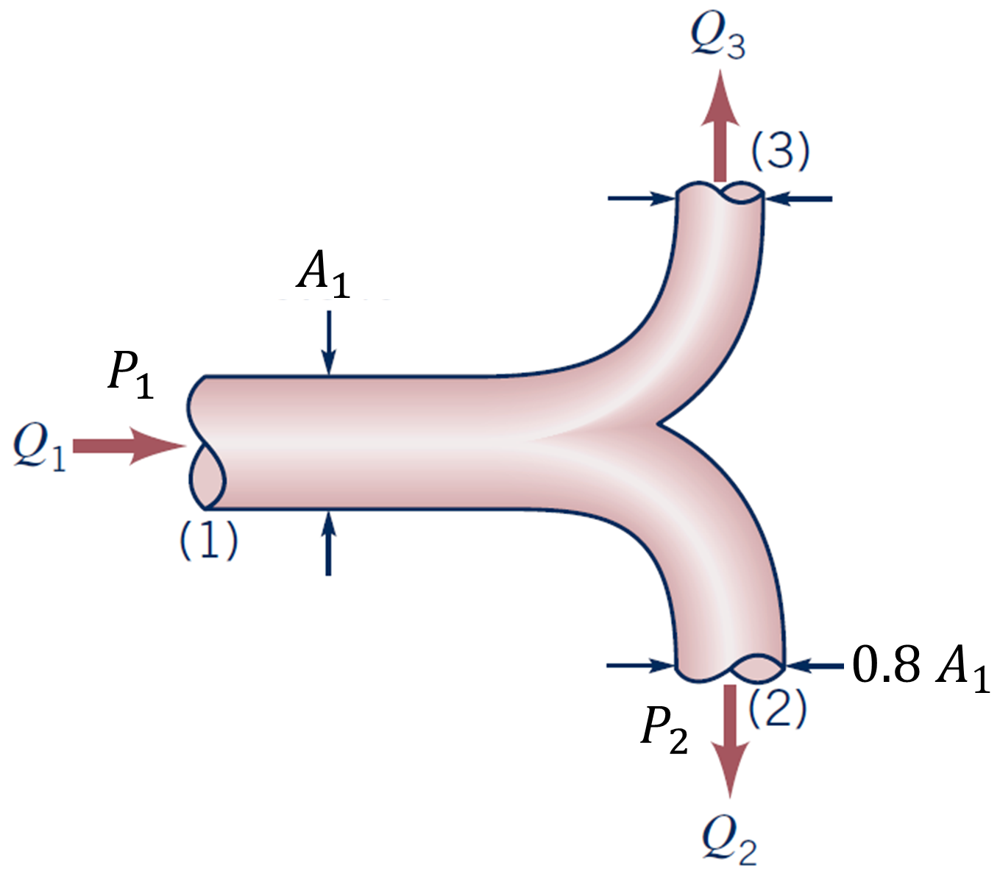

$$ P_2 = \frac{\rho}{2} \left(\left(\frac{1}{A_1}\right)^2 + \left(\frac{0.5}{0.8 \cdot A_1}\right)^2\right) Q_1^2 + P_1$$


__Data Visualization__

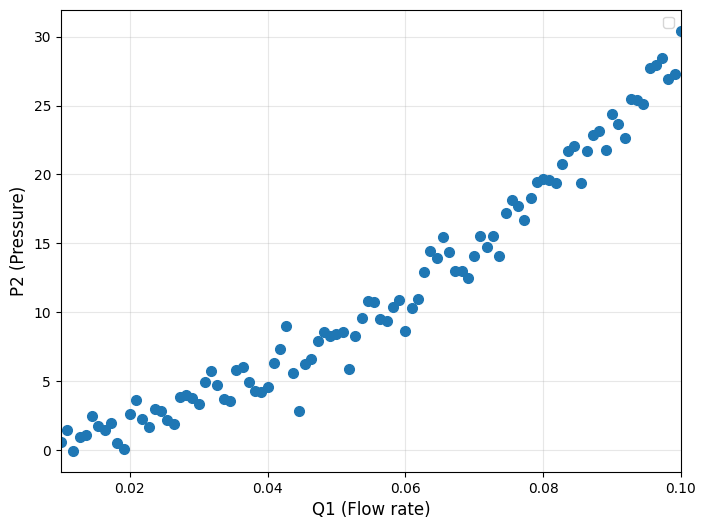

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

data = pd.read_csv('/content/drive/MyDrive/Data/pressure_flowrate.csv')
x = data['Q1'].values
y = data['P2'].values.reshape(-1, 1)

plt.figure(figsize=(8, 6))
plt.plot(x, y, 'o', markersize=7)
plt.xlabel('Q1 (Flow rate)', fontsize = 12)
plt.ylabel('P2 (Pressure)',fontsize = 12)
plt.xlim([np.min(x), np.max(x)])
plt.grid(alpha=0.3)
plt.legend()
plt.show()

__Perform Polynomial Regression__

Coefficients:
 [[9.81474551e-01]
 [2.80458041e+03]]


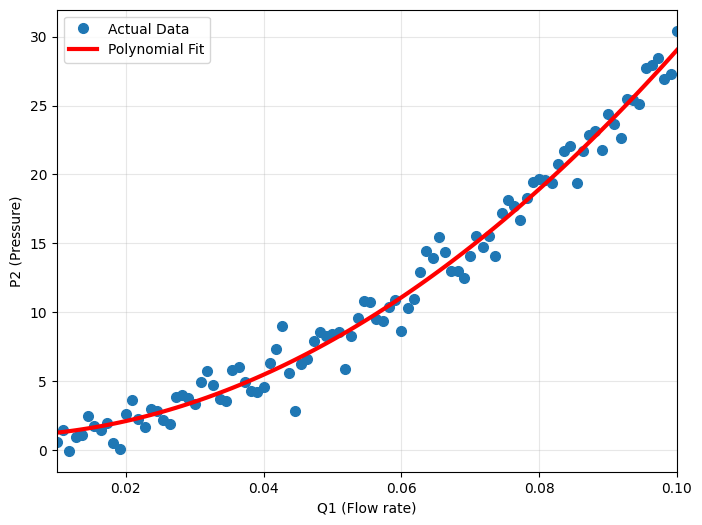

In [ ]:
A = np.vstack([np.ones_like(x), x**2]).T
A = np.asmatrix(A)

theta = (A.T * A).I * A.T * y
print('Coefficients:\n', theta)

xp = np.linspace(np.min(x), np.max(x), 100)
yp = theta[0, 0] +  theta[1, 0] * xp**2

# Plotting
plt.figure(figsize=(8, 6))
plt.plot(x, y, 'o', markersize=7, label='Actual Data')
plt.plot(xp, yp, 'r', linewidth=3, label='Polynomial Fit')
plt.xlabel('Q1 (Flow rate)')
plt.ylabel('P2 (Pressure)')
plt.xlim([np.min(x), np.max(x)])
plt.grid(alpha=0.3)
plt.legend()
plt.show()


In [ ]:
print('P1:', theta[0, 0])
print('A1:', np.sqrt(1000/2 * (1 + (0.5/0.8)**2) / theta[1, 0]))

P1: 0.9814745514542803
A1: 0.4979159866651184


## 3.2 ANN Regression
A source of strength 𝑚 is located a distance 𝑙 from a vertical solid wall as shown in the figure below. To obtain the velocity profile, sensors were placed to measure the $x$-direction velocity (𝑢) and $y$-direction velocity (𝑣) at all $x$ and $y$ coordinates. We then adjusted 𝑚 and 𝑙 and recorded the values of 𝑢 and 𝑣 at each coordinate. However, when $𝑙 = 2$, $m = 2$, and $x = 1$, the sensors failed, resulting in the loss of all 𝑢 values at every $y$-coordinate. Instead of conducting a new experiment, we plan to predict the 𝑢 values using an ANN regressor. The given conditions of our data only consider the cases where 𝑥 is not equal to 𝑙. (All variables except for 𝑢 and 𝑣 are integers)
- Download training data [here](https://www.dropbox.com/scl/fi/fqg0q0tbakqhexamf6lr5/ann_train.csv?rlkey=z5jsj1mdfkqvo2xm0uy2l66n2&st=6xuywqtx&dl=0)
- Download test data [here](https://www.dropbox.com/scl/fi/ivmgs5jdm7bhyae0oq7ok/ann_test.csv?rlkey=jbti3upm1r93lqxdnejispkv5&st=w9gr2uun&dl=0)
- Train/Test data description
    - Input data: 𝑥, 𝑦, 𝑙, 𝑚, 𝑣
    - Label: 𝑢
    - Size
        - Train: 484 sets of 𝑥, 𝑦, 𝑙, 𝑚, 𝑣, and 𝑢
        - Test: 11 sets of 𝑥, 𝑦, 𝑙, 𝑚, and 𝑣

<center>
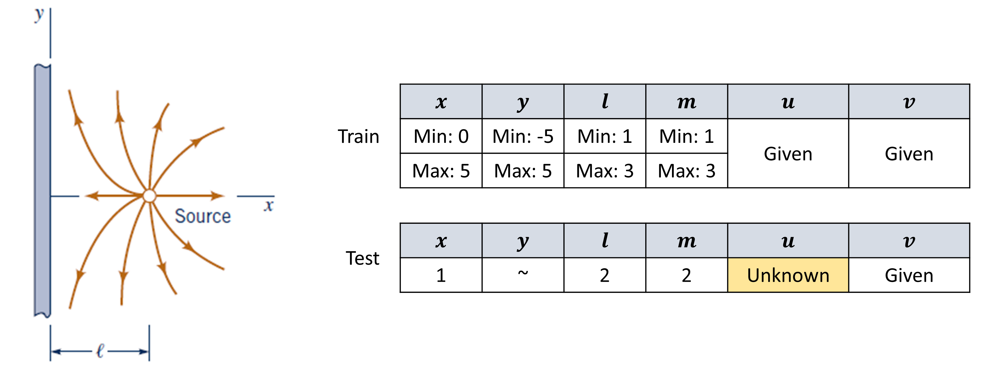

__Load Data__

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

train_data = pd.read_csv('/content/drive/MyDrive/Data/ann_train.csv')
test_data = pd.read_csv('/content/drive/MyDrive/Data/ann_test.csv')

X_train = train_data[['x', 'y', 'l', 'm', 'v']].values
y_train = train_data['u'].values
X_test = test_data[['x', 'y', 'l', 'm', 'v']].values
y_test = test_data['y'].values

__Define and Train ANN Model__

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(input_shape = (5,), units = 30, activation = 'relu'),
    tf.keras.layers.Dense(units = 100, activation = 'relu'),
    tf.keras.layers.Dense(units = 100, activation = 'relu'),
    tf.keras.layers.Dense(units = 30, activation = 'relu'),
    tf.keras.layers.Dense(units = 1)
])

model.compile(optimizer = 'adam', loss = 'mean_squared_error')
model.fit(X_train, y_train, epochs = 100, batch_size = 16, verbose = 1)

Epoch 1/100
31/31 [==============================] - 1s 3ms/step - loss: 0.0335
Epoch 2/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 3/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 4/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 5/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 6/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 7/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0021
Epoch 8/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0016
Epoch 9/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 10/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0015
Epoch 11/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0013
Epoch 12/100
31/31 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 13/100
31/31 [=================

__Make Predictions on Test Dataset__

In [ ]:
u_predicted = model.predict(X_test)

1/1 [==============================] - 0s 69ms/step


__Compare Prediction Result with Actual Velocity Profile__

In [ ]:
pi = np.pi
def calculate_u(x, y, l, m):
    if x != l:
        return m / (4 * pi) * (2 * (x - l) / ((x - l)**2 + y**2) + 2 * (x + l) / ((x + l)**2 + y**2))
    return None
# Above equation is just provided for the comparison purpose

u_actual = [calculate_u(row['x'], row['y'], row['l'], row['m']) for index, row in test_data.iterrows()]

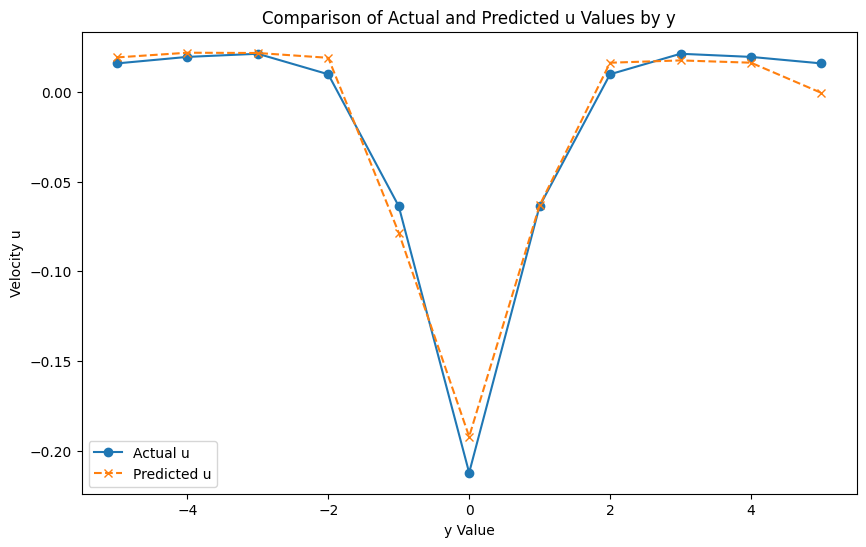

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y_test, u_actual, label='Actual u', marker='o')
plt.plot(y_test, u_predicted, label='Predicted u', linestyle='--', marker='x')
plt.title('Comparison of Actual and Predicted u Values by y')
plt.xlabel('y Value')
plt.ylabel('Velocity u')
plt.legend()
plt.show()

## 3.3 CNN Regression

<center>
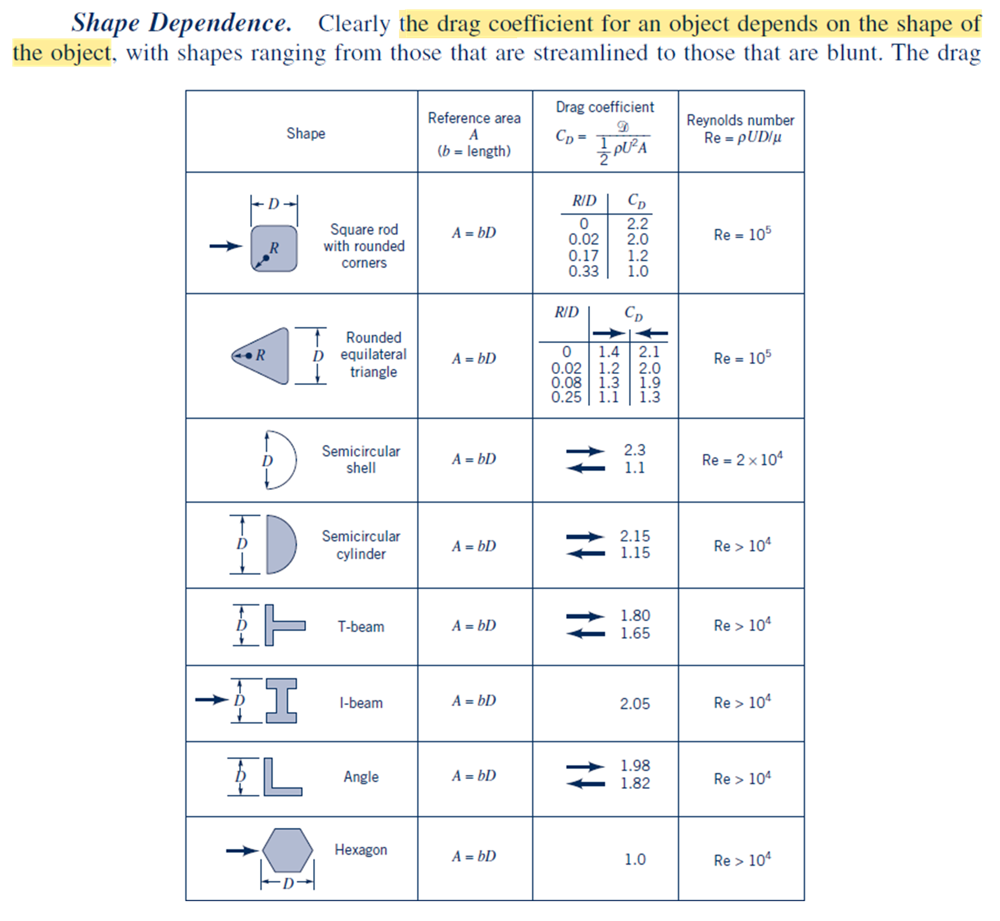

As we learned in fluid dynamics, the drag coefficient depends on the shape. Therefore, we usually measure the drag coefficient through experiments in a wind tunnel. However, before that, we use simulations to calculate the drag coefficient, and only the shapes with the best results are fabricated and tested, for the sake of time and resource limitations. Running simulations for all shapes is computationally expensive requiring significant time and computing resources. To solve this problem, we plan to build a CNN (Convolutional Neural Network) model that can act as a surrogate for the simulations. This approach is referred to as surrogate modeling.

Conventionally, we should construct a mesh as shown in the figure below and derive the drag coefficient using a computational fluid dynamics program.

<center>
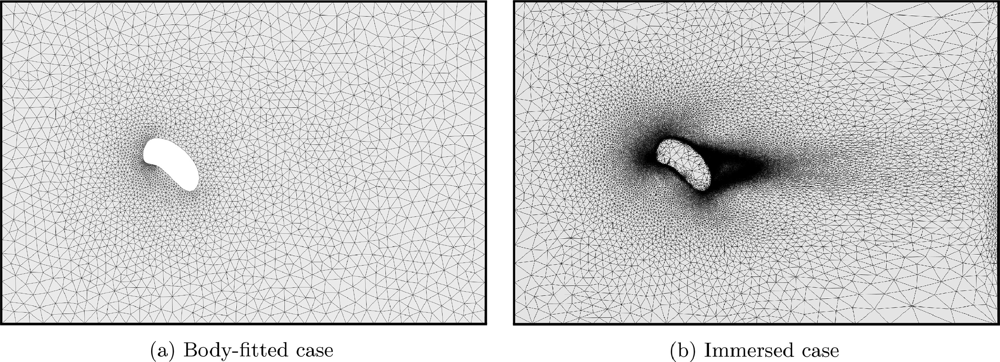

However, we are going to build a CNN model that can predict the drag of a given shape.

<center>
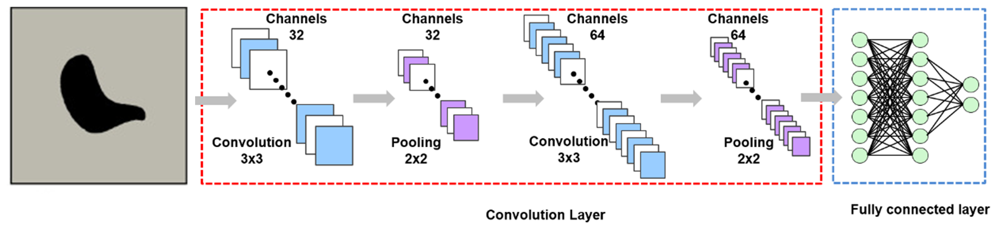

- Download image data [here](https://www.dropbox.com/scl/fi/mnumfhckygr2qnx2o3w95/imgs.npy?rlkey=fgc1kqpafw068g50bh67lbj50&st=ovwlgpav&dl=0)
- Download label data [here](https://www.dropbox.com/scl/fi/hrcvc3cp1id1qd0ts0562/labels.npy?rlkey=d09c1hoqsv32uy9kuuyq7fd7d&st=rxmvktt0&dl=0)
- Train/Test data description
    - Input data: 128 x 128 images
    - Label: drag coefficient
    - Size
        - Train: 2400 different shapes and their corresponding drag coefficient
        - Test: 600 different shapes

__Load Data__

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt

imgs = np.load('/content/drive/MyDrive/Data/imgs.npy')
sol = np.load('/content/drive/MyDrive/Data/labels.npy')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(imgs, sol, test_size = 0.2, random_state = 42)

In [ ]:
X_train.shape

(2400, 128, 128, 1)

In [ ]:
X_test.shape

(600, 128, 128, 1)

__Define and Train CNN Model__

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', padding = 'SAME', input_shape = (128, 128, 1)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation = 'relu', padding = 'SAME'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation = 'relu', padding = 'SAME'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation = 'relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer = 'adam', loss = 'mean_squared_error')
history = model.fit(X_train, y_train, epochs = 10, batch_size = 32, validation_split = 0.1)

Epoch 1/10
68/68 [==============================] - 5s 20ms/step - loss: 0.3414 - val_loss: 0.0117
Epoch 2/10
68/68 [==============================] - 1s 11ms/step - loss: 0.0068 - val_loss: 0.0048
Epoch 3/10
68/68 [==============================] - 1s 11ms/step - loss: 0.0039 - val_loss: 0.0047
Epoch 4/10
68/68 [==============================] - 1s 11ms/step - loss: 0.0032 - val_loss: 0.0053
Epoch 5/10
68/68 [==============================] - 1s 11ms/step - loss: 0.0027 - val_loss: 0.0051
Epoch 6/10
68/68 [==============================] - 1s 11ms/step - loss: 0.0028 - val_loss: 0.0097
Epoch 7/10
68/68 [==============================] - 1s 11ms/step - loss: 0.0029 - val_loss: 0.0062
Epoch 8/10
68/68 [==============================] - 1s 11ms/step - loss: 0.0040 - val_loss: 0.0034
Epoch 9/10
68/68 [==============================] - 1s 11ms/step - loss: 0.0023 - val_loss: 0.0048
Epoch 10/10
68/68 [==============================] - 1s 11ms/step - loss: 0.0019 - val_loss: 0.0028


__Compare Prediction Result on Test Dataset with Actual Drag Coefficient__

19/19 [==============================] - 0s 12ms/step
Mean Absolute Error: 0.03767948780501047
R^2 Score: 0.986536157098553


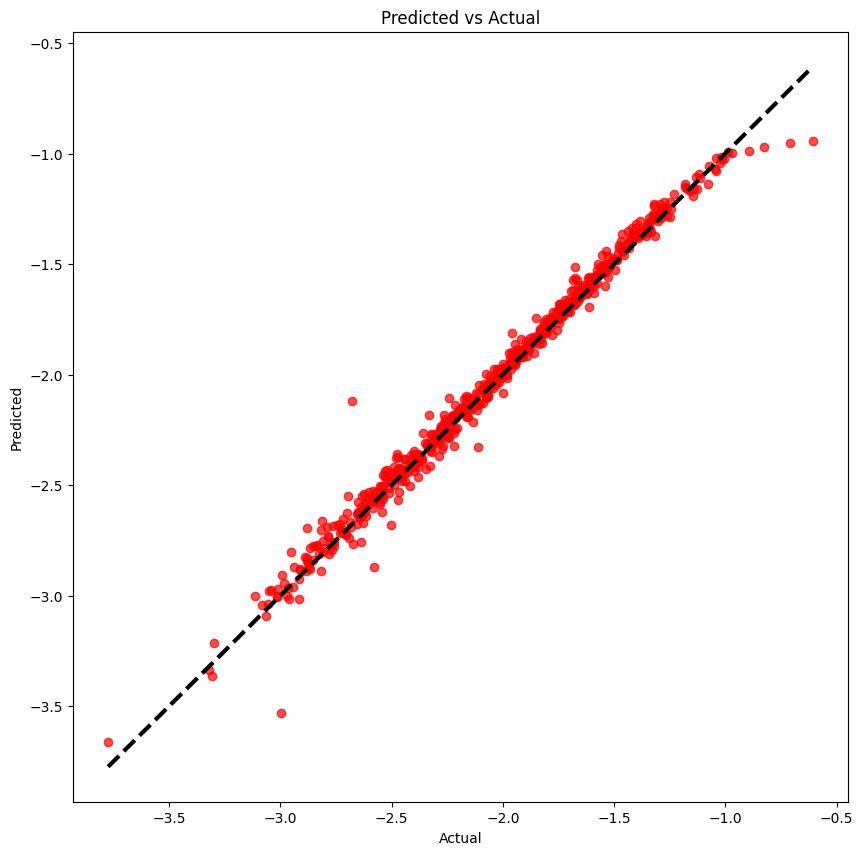

In [ ]:
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Absolute Error: {mae}")
print(f"R^2 Score: {r2}")

plt.figure(figsize = (10, 10))
plt.scatter(y_test, y_pred, alpha = 0.7, color = 'r')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw = 3)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Predicted vs Actual')
plt.show()

__Visualize Test Result__

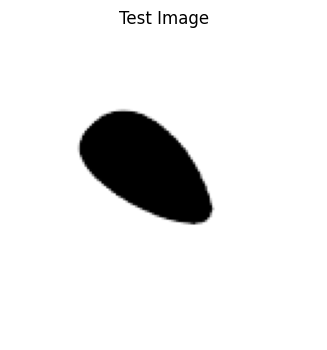

Predicted Drag Coefficient: [-1.812]
Actual Drag Coefficient: [-1.80795]


In [ ]:
idx = 0
test_img = X_test[idx:idx + 1]
test_label = y_test[idx]

predict = model.predict(test_img, verbose = 0)
predicted_drag = predict[0][0]

plt.figure(figsize = (9, 4))
plt.imshow(test_img.reshape(128, 128), cmap = 'gray')
plt.axis('off')
plt.title('Test Image')
plt.show()

print(f'Predicted Drag Coefficient: [{predicted_drag:.3f}]')
print(f'Actual Drag Coefficient: {test_label}')

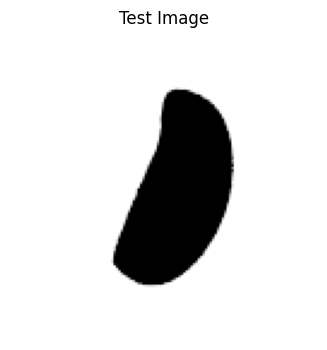

Predicted Drag Coefficient: [-2.973]
Actual Drag Coefficient: [-3.04311]


In [ ]:
idx = 200
test_img = X_test[idx:idx + 1]
test_label = y_test[idx]

predict = model.predict(test_img, verbose = 0)
predicted_drag = predict[0][0]

plt.figure(figsize = (9, 4))
plt.imshow(test_img.reshape(128, 128), cmap = 'gray')
plt.axis('off')
plt.title('Test Image')
plt.show()

print(f'Predicted Drag Coefficient: [{predicted_drag:.3f}]')
print(f'Actual Drag Coefficient: {test_label}')

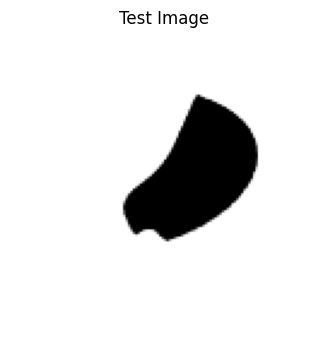

Predicted Drag Coefficient: [-2.189]
Actual Drag Coefficient: [-2.16572]


In [ ]:
idx = 300
test_img = X_test[idx:idx + 1]
test_label = y_test[idx]

predict = model.predict(test_img, verbose = 0)
predicted_drag = predict[0][0]

plt.figure(figsize = (9, 4))
plt.imshow(test_img.reshape(128, 128), cmap = 'gray')
plt.axis('off')
plt.title('Test Image')
plt.show()

print(f'Predicted Drag Coefficient: [{predicted_drag:.3f}]')
print(f'Actual Drag Coefficient: {test_label}')

## 3.4. PINN with Data

- We will solve 2D Navier-Stokes Equations to find velocity profile in infinite parallel plates flow
    - Any fluid flowing in plates had to enter at some location. The region of flow near where the fluid enters the plates is termed the _entrance region_ and is illustrated in below figure
    - The fluid typically enters the plates with a nearly uniform velocity profile
    - As the fluid moves through the plates, viscous effects cause it to stick to the plates wall (no-slip boundary condition)
- Thus, a boundary layer is produced along the plates wall such that the initial velocity profile changes with distance along the plates, $x$, until the fluid reaches the end of the hydrodynamic entrance region (which is also called entrance length) beyond which the velocity profile does not vary with $x$

<center>
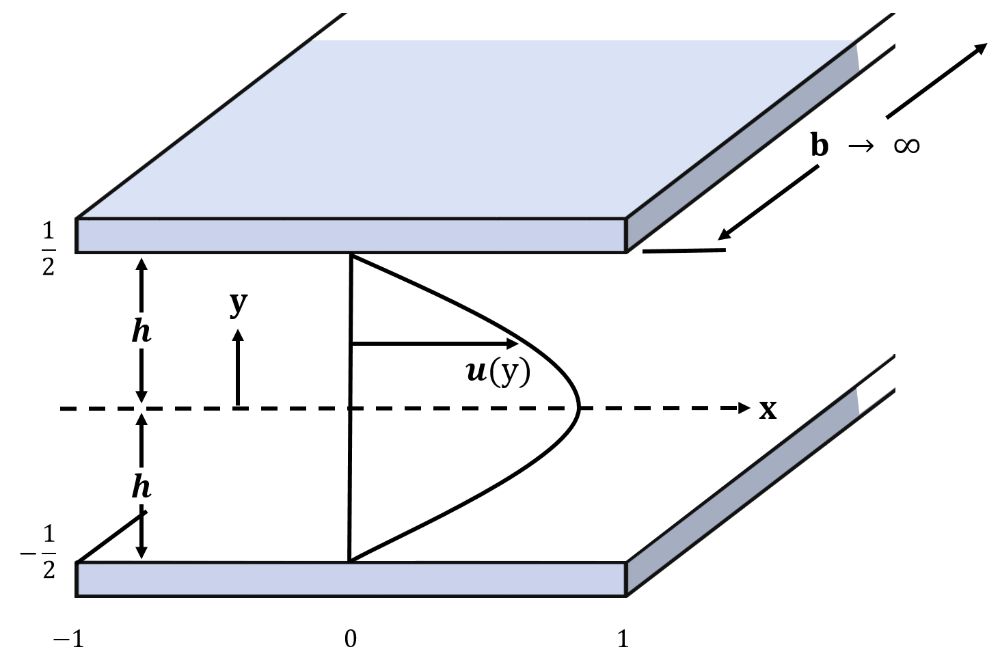

- Problem properties

<br>
$$\rho = 1\operatorname{kg/m^3}, \quad \mu = 1\operatorname{N\cdot s/m^2}, \quad D = 2h = 1\operatorname{m}, \quad
L = 2\operatorname{m}, \quad u_{in} = 1\operatorname{m/s}, \quad \nu = \frac{\mu}{\rho}$$

<br>

- Hydraulic diameter is

<br>
$$\quad D_h = \lim\limits_{b\to\infty} {4(2bh) \over {2b+4h}} = 4h = 2\operatorname{m}$$
<br>

- So, the Reynolds number of this system is

<br>
$$Re = \frac{\rho u_{in} D_h}{\mu} = 2 $$
<br>


- 2D Navier-Stokes Equations & boundary conditions (for steady state)


<br>
$$
\begin{align*}
u{\partial u \over \partial x} + v{\partial u \over \partial y} + {1 \over \rho}{\partial p \over \partial x} - \nu \ \left({\partial^2 u \over {\partial x^2}} + {\partial^2 u \over {\partial y^2}}\right) &= 0\\\\
u{\partial v \over \partial x} + v{\partial v \over \partial y} + {1 \over \rho}{\partial p \over \partial y} - \nu \ \left({\partial^2 v \over {\partial x^2}} + {\partial^2 v \over {\partial y^2}}\right) &= 0\\\\
{\partial u \over \partial x} + {\partial v \over \partial y} &= 0
\end{align*}
$$

<br>

- Two Dirichlet boundary conditions on the plate boundary (no-slip condition),

<br>
$$u(x,y) = 0, \quad v(x,y) = 0 \qquad \text{at} \quad y = \frac{D}{2} \ \; \text{or} \; -\frac{D}{2}$$
<br>

- Two Dirichlet boundary conditions at the inlet boundary

<br>
$$u(-1,y) = u_{\text{in}}, \quad v(-1,y) = 0$$
<br>

- Two Dirichlet boundary conditions at the outlet boundary

<br>
$$p(1,y) = 0, \quad v(1,y) = 0$$
<br>

- This time, we will attempt two approaches
    - First, we will build a model based on ANN whose input and output are presented below. When using the ANN, we will train it with big data.

<center>
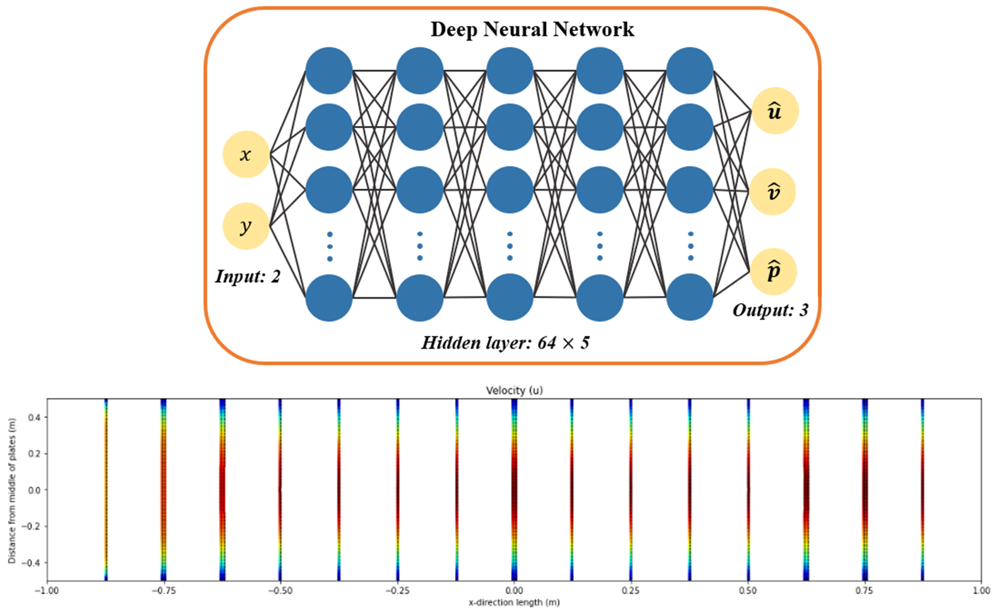

 - Next, we will build a model based on PINN, applying both PDE loss and data loss as described below.
     - When using PINN to solve our problem, we will train it with small data.
     - Despite using less data, we will see that the PINN, which utilizes the PDE, yields better results than the ANN.

<center>
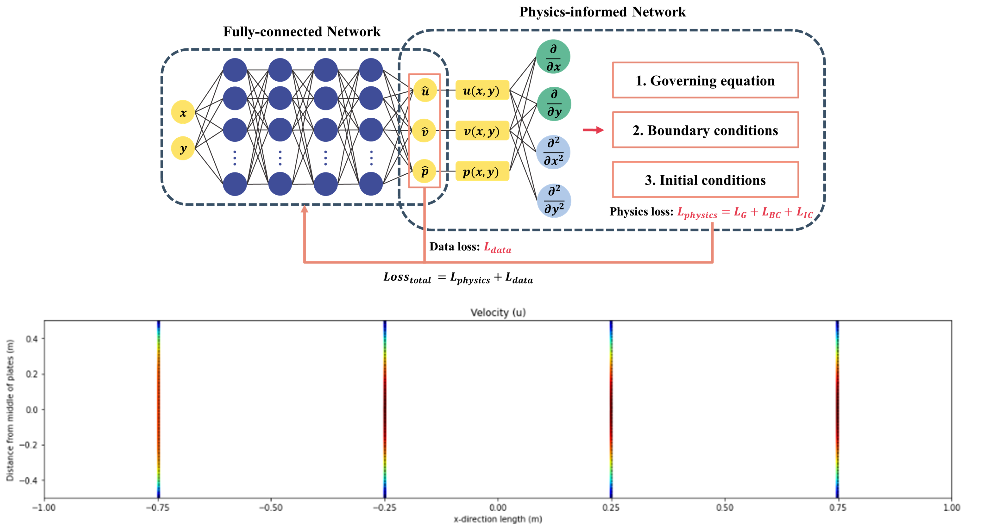

### 3.4.1. Data-driven Approach with Big data

__Load and Sample Data__

- Download data [here](https://www.dropbox.com/scl/fi/1dec01cpdl8z8n55rjzzt/fluid_bigdata.npy?rlkey=w8dg3y5kjqoxx6dl91rzvo5gj&st=giyykty6&dl=0)

In [ ]:
!pip install deepxde

In [ ]:
import deepxde as dde
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

Deepxde backend not selected or invalid. Assuming tensorflow.compat.v1 for now.
Using backend: tensorflow.compat.v1



Setting the default backend to "tensorflow.compat.v1". You can change it in the ~/.deepxde/config.json file or export the DDEBACKEND environment variable. Valid options are: tensorflow.compat.v1, tensorflow, pytorch, jax, paddle (all lowercase)
Instructions for updating:
non-resource variables are not supported in the long term



In [ ]:
from deepxde.backend.set_default_backend import set_default_backend
set_default_backend("tensorflow")

In [ ]:
fluid_bigdata = np.load('/content/drive/MyDrive/Data/fluid_bigdata.npy')

observe_x = fluid_bigdata[:, :2]
observe_y = fluid_bigdata[:, 2:]

In [ ]:
observe_u = dde.icbc.PointSetBC(observe_x, observe_y[:, 0].reshape(-1, 1), component=0)
observe_v = dde.icbc.PointSetBC(observe_x, observe_y[:, 1].reshape(-1, 1), component=1)
observe_p = dde.icbc.PointSetBC(observe_x, observe_y[:, 2].reshape(-1, 1), component=2)

__Define Parameters__

In [ ]:
# Properties
rho = 1
mu = 1
u_in = 1
D = 1
L = 2

__Define Geometry__

In [ ]:
geom = dde.geometry.Rectangle(xmin = [-L/2, -D/2], xmax = [L/2, D/2])
data = dde.data.PDE(geom,
                    None,
                    [observe_u, observe_v, observe_p],
                    num_domain = 0,
                    num_boundary = 0,
                    num_test = 100)

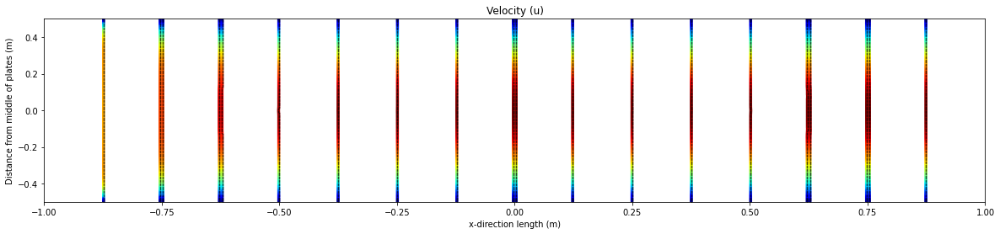

In [ ]:
plt.figure(figsize = (20,4))
plt.scatter(data.train_x_all[:,0], data.train_x_all[:,1], s = 0.5)
plt.scatter(observe_x[:, 0], observe_x[:, 1], c = observe_y[:, 0], s = 6.5, cmap = 'jet')
plt.scatter(observe_x[:, 0], observe_x[:, 1], s = 0.5, color='k', alpha = 0.5)
plt.xlim((0-L/2, L-L/2))
plt.ylim((0-D/2, D-D/2))
plt.xlabel('x-direction length (m)')
plt.ylabel('Distance from middle of plates (m)')
plt.title('Velocity (u)')
plt.show()

__Define Network and Hyper-parameters__

In [ ]:
layer_size = [2] + [64] * 5 + [3]
activation = "tanh"
initializer = "Glorot uniform"

net = dde.maps.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr = 1e-3)

Compiling model...
Building feed-forward neural network...
'build' took 0.092175 s



/usr/local/lib/python3.7/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:110: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  kernel_constraint=self.kernel_constraint,
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:261: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


'compile' took 3.501978 s



__Train (Adam Optimizer)__

In [ ]:
losshistory, train_state = model.train(epochs = 10000)
dde.saveplot(losshistory, train_state, issave = False, isplot = False)

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.18e+00, 2.81e-02, 2.01e+02]    [1.18e+00, 2.81e-02, 2.01e+02]    []  
1000      [8.32e-02, 7.61e-03, 4.87e-01]    [8.32e-02, 7.61e-03, 4.87e-01]    []  
2000      [3.26e-03, 2.92e-03, 3.97e-02]    [3.26e-03, 2.92e-03, 3.97e-02]    []  
3000      [1.28e-03, 1.67e-03, 1.85e-02]    [1.28e-03, 1.67e-03, 1.85e-02]    []  
4000      [5.72e-04, 5.96e-04, 2.62e-02]    [5.72e-04, 5.96e-04, 2.62e-02]    []  
5000      [3.22e-04, 3.20e-04, 4.66e-03]    [3.22e-04, 3.20e-04, 4.66e-03]    []  
6000      [2.47e-04, 2.22e-04, 3.97e-03]    [2.47e-04, 2.22e-04, 3.97e-03]    []  
7000      [1.68e-04, 1.28e-04, 2.89e-03]    [1.68e-04, 1.28e-04, 2.89e-03]    []  
8000      [1.32e-04, 8.76e-05, 1.68e-03]    [1.32e-04, 8.76e-05, 1.68e-03]    []  
9000      [8.23e-05, 6.97e-05, 8.99e-04]    [8.23e-05, 6.97e-05, 8.99e-04]    []  
10000     [6.16e-05, 5.54e-05, 8.38

__Train More (L-BFGS Optimizer)__

Compiling model...
'compile' took 0.152857 s

Training model...

Step      Train loss                        Test loss                         Test metric
10000     [6.16e-05, 5.54e-05, 8.38e-04]    [6.16e-05, 5.54e-05, 8.38e-04]    []  
11000     [6.13e-06, 5.24e-06, 6.89e-05]                                          
12000     [4.42e-06, 1.44e-06, 5.44e-05]                                          
INFO:tensorflow:Optimization terminated with:
  Message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
  Objective function value: 0.000057
  Number of iterations: 2083
  Number of functions evaluations: 2257
12257     [3.66e-06, 1.33e-06, 5.23e-05]    [3.66e-06, 1.33e-06, 5.23e-05]    []  

Best model at step 12257:
  train loss: 5.73e-05
  test loss: 5.73e-05
  test metric: []

'train' took 42.100872 s



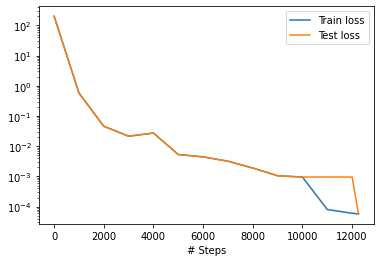

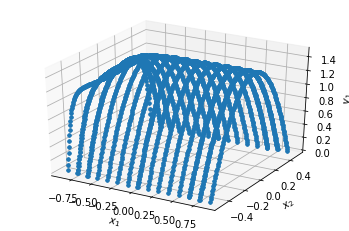

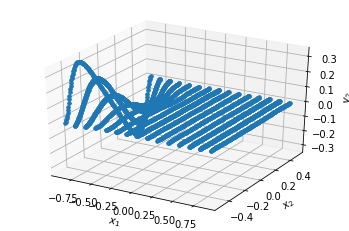

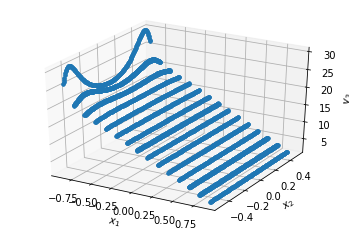

In [ ]:
dde.optimizers.config.set_LBFGS_options(maxiter=3000)
model.compile("L-BFGS")
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave = False, isplot = True)

__Plot Results (Adam + L-BFGS)__

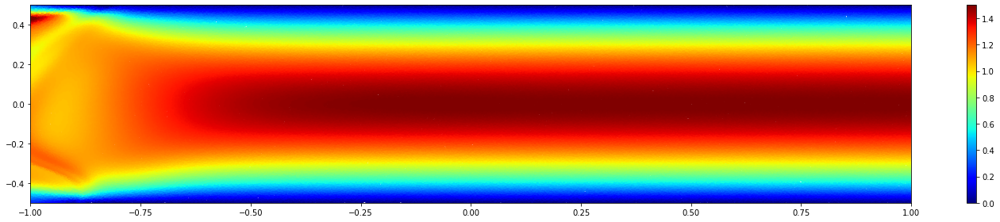

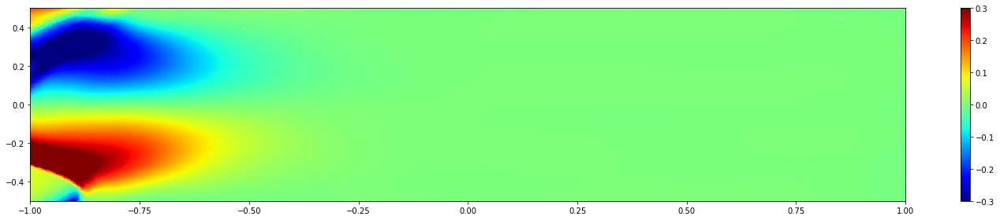

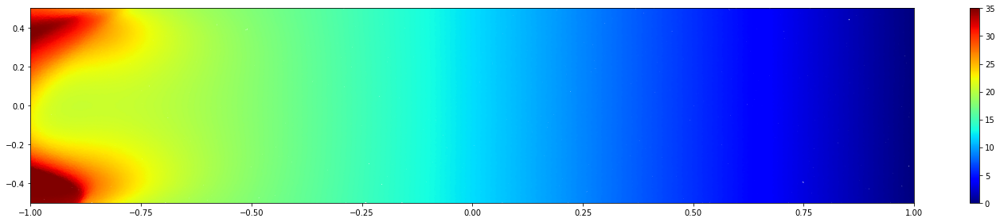

In [ ]:
samples = geom.random_points(500000)
result = model.predict(samples)
color_legend = [[0, 1.5], [-0.3, 0.3], [0, 35]]

for idx in range(3):
    plt.figure(figsize = (20, 4))
    plt.scatter(samples[:, 0],
                samples[:, 1],
                c = result[:, idx],
                s = 2,
                cmap = 'jet')
    plt.colorbar()
    plt.clim(color_legend[idx])
    plt.xlim((0-L/2, L-L/2))
    plt.ylim((0-D/2, D-D/2))
    plt.tight_layout()
    plt.show()

### 3.4.2 PINN with Small Data

__Load and Sample Data__

- Download data [here](https://www.dropbox.com/scl/fi/jgn8hqo9x19uo86kmzzn3/fluid_smalldata.npy?rlkey=dy6cxct5r7d3fn2z7jqvr1o0s&st=cwl2ndus&dl=0)

In [ ]:
fluid_smalldata = np.load('/content/drive/MyDrive/Data/fluid_smalldata.npy')

observe_x = fluid_smalldata[:, :2]
observe_y = fluid_smalldata[:, 2:]

In [ ]:
observe_u = dde.icbc.PointSetBC(observe_x, observe_y[:, 0].reshape(-1, 1), component=0)
observe_v = dde.icbc.PointSetBC(observe_x, observe_y[:, 1].reshape(-1, 1), component=1)
observe_p = dde.icbc.PointSetBC(observe_x, observe_y[:, 2].reshape(-1, 1), component=2)

__Define PDE with Boundary & Initial Conditions__

In [ ]:
def boundary_wall(X, on_boundary):
    on_wall = np.logical_and(np.logical_or(np.isclose(X[1], -D/2), np.isclose(X[1], D/2)), on_boundary)
    return on_wall

def boundary_inlet(X, on_boundary):
    return on_boundary and np.isclose(X[0], -L/2)

def boundary_outlet(X, on_boundary):
    return on_boundary and np.isclose(X[0], L/2)

In [ ]:
def pde(X, Y):
    du_x = dde.grad.jacobian(Y, X, i = 0, j = 0)
    du_y = dde.grad.jacobian(Y, X, i = 0, j = 1)
    dv_x = dde.grad.jacobian(Y, X, i = 1, j = 0)
    dv_y = dde.grad.jacobian(Y, X, i = 1, j = 1)
    dp_x = dde.grad.jacobian(Y, X, i = 2, j = 0)
    dp_y = dde.grad.jacobian(Y, X, i = 2, j = 1)
    du_xx = dde.grad.hessian(Y, X, i = 0, j = 0, component = 0)
    du_yy = dde.grad.hessian(Y, X, i = 1, j = 1, component = 0)
    dv_xx = dde.grad.hessian(Y, X, i = 0, j = 0, component = 1)
    dv_yy = dde.grad.hessian(Y, X, i = 1, j = 1, component = 1)

    pde_u = Y[:,0:1] * du_x + Y[:,1:2] * du_y + 1/rho * dp_x - (mu/rho) * (du_xx + du_yy)
    pde_v = Y[:,0:1] * dv_x + Y[:,1:2] * dv_y + 1/rho * dp_y - (mu/rho) * (dv_xx + dv_yy)
    pde_cont = du_x + dv_y

    return [pde_u, pde_v, pde_cont]

__Define Geometry and Implement Boundary Condition__

In [ ]:
geom = dde.geometry.Rectangle(xmin=[-L/2, -D/2], xmax=[L/2, D/2])

bc_wall_u = dde.DirichletBC(geom, lambda X: 0., boundary_wall, component = 0)
bc_wall_v = dde.DirichletBC(geom, lambda X: 0., boundary_wall, component = 1)

bc_inlet_u = dde.DirichletBC(geom, lambda X: u_in, boundary_inlet, component = 0)
bc_inlet_v = dde.DirichletBC(geom, lambda X: 0., boundary_inlet, component = 1)

bc_outlet_p = dde.DirichletBC(geom, lambda X: 0., boundary_outlet, component = 2)
bc_outlet_v = dde.DirichletBC(geom, lambda X: 0., boundary_outlet, component = 1)

In [ ]:
data = dde.data.PDE(geom,
                    pde,
                    [bc_wall_u, bc_wall_v, bc_inlet_u, bc_inlet_v, bc_outlet_p, bc_outlet_v, observe_u, observe_v, observe_p],
                    num_domain = 1000,
                    num_boundary = 500,
                    num_test = 1000,
                    train_distribution = 'LHS')

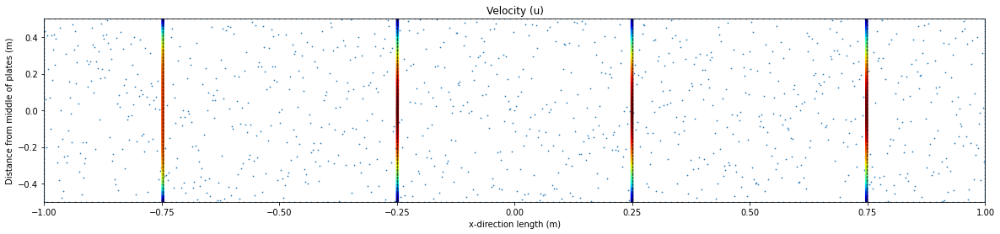

In [ ]:
plt.figure(figsize = (20,4))
plt.scatter(data.train_x_all[:,0], data.train_x_all[:,1], s = 0.5)
plt.scatter(observe_x[:, 0], observe_x[:, 1], c = observe_y[:, 0], s = 6.5, cmap = 'jet')
plt.scatter(observe_x[:, 0], observe_x[:, 1], s = 0.5, color='k', alpha = 0.5)
plt.xlim((0-L/2, L-L/2))
plt.ylim((0-D/2, D-D/2))
plt.xlabel('x-direction length (m)')
plt.ylabel('Distance from middle of plates (m)')
plt.title('Velocity (u)')
plt.show()

__Define Network and Hyper-parameters__

In [ ]:
layer_size = [2] + [64] * 5 + [3]
activation = "tanh"
initializer = "Glorot uniform"

net = dde.maps.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr = 1e-3, loss_weights = [1, 1, 1, 1, 1, 1, 1, 1, 1, 9, 9, 9])

Compiling model...
Building feed-forward neural network...
'build' took 0.087828 s



/usr/local/lib/python3.7/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:110: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  kernel_constraint=self.kernel_constraint,
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:261: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


'compile' took 1.969883 s



__Train (Adam Optimizer)__

In [ ]:
losshistory, train_state = model.train(epochs = 10000)
dde.saveplot(losshistory, train_state, issave = False, isplot = False)

Initializing variables...
Training model...

Step      Train loss                                                                                                                  Test loss                                                                                                                   Test metric
0         [1.78e-02, 1.15e-01, 3.57e-03, 2.76e-02, 4.75e-04, 1.16e+00, 8.45e-04, 1.35e-02, 8.43e-04, 1.06e+01, 4.90e-02, 1.78e+03]    [1.56e-02, 1.20e-01, 3.60e-03, 2.76e-02, 4.75e-04, 1.16e+00, 8.45e-04, 1.35e-02, 8.43e-04, 1.06e+01, 4.90e-02, 1.78e+03]    []  
1000      [5.46e-02, 8.70e-02, 1.11e-01, 5.35e-02, 3.75e-03, 4.73e-02, 9.23e-05, 2.43e-03, 7.06e-05, 4.37e-02, 4.02e-02, 7.17e-01]    [5.67e-02, 1.03e-01, 1.23e-01, 5.35e-02, 3.75e-03, 4.73e-02, 9.23e-05, 2.43e-03, 7.06e-05, 4.37e-02, 4.02e-02, 7.17e-01]    []  
2000      [1.52e-02, 1.73e-02, 5.53e-02, 1.57e-02, 5.15e-04, 6.24e-02, 9.86e-04, 3.90e-04, 3.93e-04, 2.72e-02, 1.10e-02, 2.00e-01]    [2.15e-02, 2.01e-02, 5.19

__Train More (L-BFGS Optimizer)__

Compiling model...
'compile' took 1.503600 s

Training model...

Step      Train loss                                                                                                                  Test loss                                                                                                                   Test metric
10000     [4.43e-03, 3.76e-03, 6.28e-02, 1.46e-02, 5.73e-04, 4.90e-02, 1.01e-02, 5.68e-05, 3.82e-05, 1.85e-02, 1.23e-02, 1.68e-02]    [6.54e-03, 6.76e-03, 5.95e-02, 1.46e-02, 5.73e-04, 4.90e-02, 1.01e-02, 5.68e-05, 3.82e-05, 1.85e-02, 1.23e-02, 1.68e-02]    []  
11000     [3.78e-03, 3.96e-03, 3.07e-02, 1.18e-02, 1.17e-03, 1.45e-02, 1.86e-02, 1.70e-05, 3.26e-05, 8.61e-03, 5.59e-03, 5.02e-03]                                                                                                                                    
12000     [3.04e-03, 2.79e-03, 8.35e-03, 8.85e-03, 4.59e-04, 1.09e-02, 6.52e-03, 3.81e-05, 1.69e-05, 1.86e-03, 1.27e-03, 1.23e-03]         

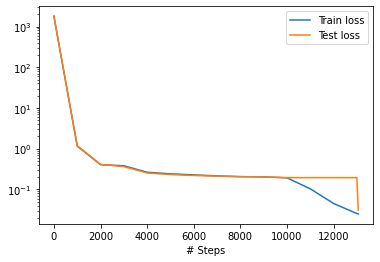

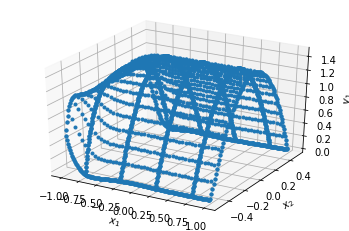

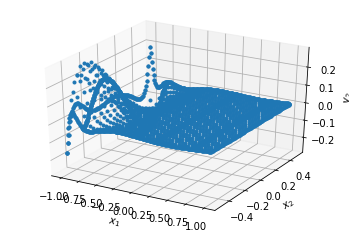

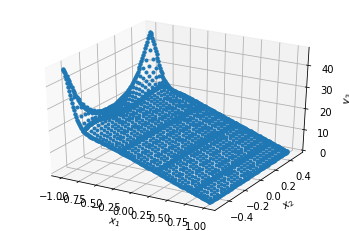

In [ ]:
dde.optimizers.config.set_LBFGS_options(maxiter=3000)
model.compile("L-BFGS", loss_weights = [1, 1, 1, 1, 1, 1, 1, 1, 1, 9, 9, 9])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave = False, isplot = True)

__Plot Results (Adam + L-BFGS)__

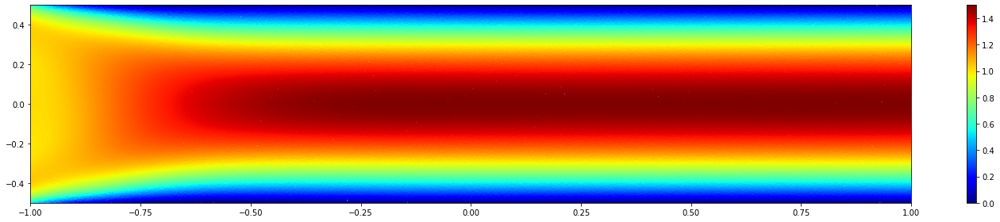

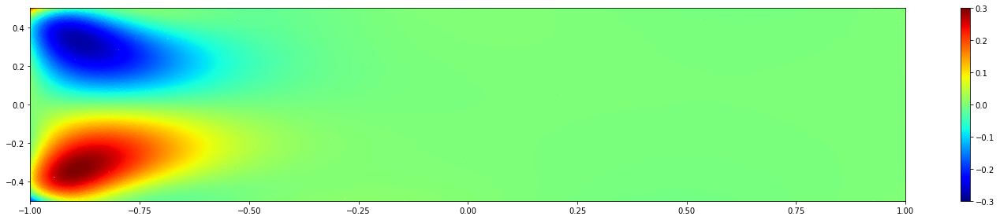

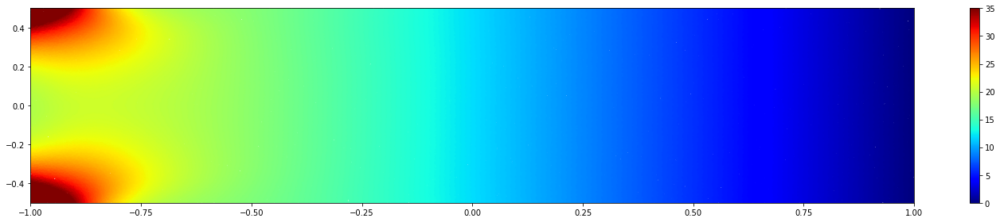

In [ ]:
samples = geom.random_points(500000)
result = model.predict(samples)
color_legend = [[0, 1.5], [-0.3, 0.3], [0, 35]]

for idx in range(3):
    plt.figure(figsize = (20, 4))
    plt.scatter(samples[:, 0],
                samples[:, 1],
                c = result[:, idx],
                s = 2,
                cmap = 'jet')
    plt.colorbar()
    plt.clim(color_legend[idx])
    plt.xlim((0-L/2, L-L/2))
    plt.ylim((0-D/2, D-D/2))
    plt.tight_layout()
    plt.show()